In [ ]:
!python -m pip install pyyaml==5.1
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 11.8 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=82a7d1ab6d71ff3d9b63fa89132085dd02d57fd870229fc0b3ca977257e6b899
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-68bv47ih
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-68bv47ih
     |████████████████████████████████| 50 kB 3.9 MB/s 
     |████████████████████████████████| 79 kB

In [ ]:
import torch
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
PATH = "/gdrive/MyDrive/pigs/prelabel_12_training"
LABEL_PATH = "labels/all"
IMAGE_PATH = "images/all_images"
IMAGE_EXT = ".jpg"

files_in_folder = lambda path: next(os.walk(path), (None, None, []))[2]




class LabeledImage():
    def __init__(self, label_filename):
        self.label_filename = label_filename
        self.label_path = os.path.join(PATH, LABEL_PATH, self.label_filename)
        self.frame_name = os.path.splitext(self.label_filename)[0]
        self.image_filename = self.frame_name + IMAGE_EXT
        self.image_path = os.path.join(PATH, IMAGE_PATH, self.image_filename)

        if self.check_image_file():
            self.load_annotations()
            self.convert_annotations()


    def check_image_file(self):
        image_exists = os.path.isfile(self.image_path)
        if not image_exists:
            print(f"Image file for label {self.label_filename} does not exist.")
        else:
            image = cv2.imread(self.image_path)
            self.image_height = image.shape[0]
            self.image_width = image.shape[1]

        return image_exists

    
    def load_annotations(self):
        with open(self.label_path, "r") as file:
            lines = file.readlines()
            lines = [line.rstrip() for line in lines]

        self.annotations = [{
            "class_id": int(line[0]),
            "x": float(line[1]) * self.image_width,
            "y": float(line[2]) * self.image_height,
            "w": float(line[3]) * self.image_width,
            "h": float(line[4]) * self.image_height,
        }       
        for line in [ln.split(" ") for ln in lines]]

    def convert_annotations(self):
        an_val = lambda a: (a["x"], a["y"], a["w"], a["h"])
        self.converted_annotations = []
        for annotation in self.annotations:
            converted_annotation_values = convert_annotation(*an_val(annotation))
            self.converted_annotations.append({
                "class_id": annotation["class_id"],
                "x1": round(converted_annotation_values[0]),
                "y1": round(converted_annotation_values[1]),
                "x2": round(converted_annotation_values[2]),
                "y2": round(converted_annotation_values[3]),
            }) 


    def to_detectron2_dict(self):
        file_name = self.image_path
        height = self.image_height
        width = self.image_width
        annotation_to_detectron = lambda a: {"category_id": a["class_id"], "bbox": [a["x1"], a["y1"], a["x2"], a["y2"]], "bbox_mode": 0}

        return {
            "file_name": file_name,
            "height": height,
            "width": width,
            "annotations": [annotation_to_detectron(ann) for ann in self.converted_annotations]
        }
            
        
def convert_annotation(x, y, w, h):
    x1, y1 = x-w/2, y-h/2
    x2, y2 = x+w/2, y+h/2
    return x1, y1, x2, y2
        

def prepare_dataset():
    # Load label filenames
    label_filenames = files_in_folder(os.path.join(PATH, LABEL_PATH))
    label_filenames = [fn for fn in label_filenames if "classes" not in fn]
    images = label_filenames
    return [LabeledImage(filename).to_detectron2_dict() for filename in label_filenames]

In [ ]:
dataset = prepare_dataset()
DatasetCatalog.register("pigs", lambda: dataset)
MetadataCatalog.get("pigs").set(thing_classes=["pig"])
pigs_metadata = MetadataCatalog.get("pigs")

In [ ]:
dataset = DatasetCatalog.get("pigs")

AssertionError: ignored

In [ ]:
dataset

[{'annotations': [{'bbox': [99, 583, 587, 750],
    'bbox_mode': 0,
    'category_id': 0},
   {'bbox': [78, 514, 626, 651], 'bbox_mode': 0, 'category_id': 0},
   {'bbox': [573, 186, 1020, 348], 'bbox_mode': 0, 'category_id': 0},
   {'bbox': [129, 382, 607, 551], 'bbox_mode': 0, 'category_id': 0},
   {'bbox': [387, 279, 887, 428], 'bbox_mode': 0, 'category_id': 0},
   {'bbox': [205, 566, 849, 880], 'bbox_mode': 0, 'category_id': 0},
   {'bbox': [809, 666, 1232, 1068], 'bbox_mode': 0, 'category_id': 0},
   {'bbox': [205, 432, 669, 570], 'bbox_mode': 0, 'category_id': 0},
   {'bbox': [401, 631, 959, 846], 'bbox_mode': 0, 'category_id': 0},
   {'bbox': [351, 806, 675, 1080], 'bbox_mode': 0, 'category_id': 0},
   {'bbox': [620, 786, 916, 1080], 'bbox_mode': 0, 'category_id': 0}],
  'file_name': 'ch01_20211120083829.mp4_0.jpg',
  'height': 1080,
  'width': 1920},
 {'annotations': [{'bbox': [350, 799, 684, 1080],
    'bbox_mode': 0,
    'category_id': 0},
   {'bbox': [180, 426, 651, 556], 'bb

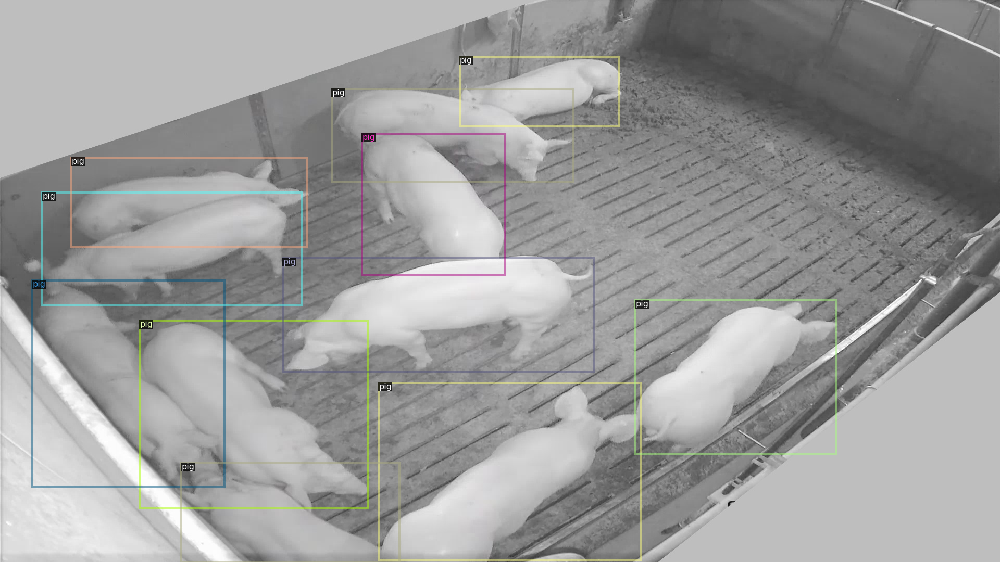

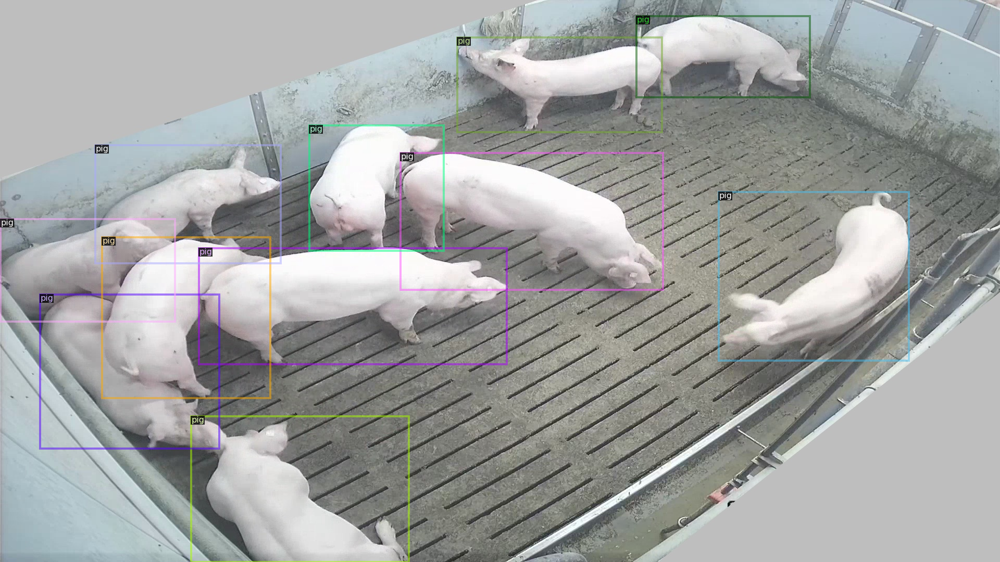

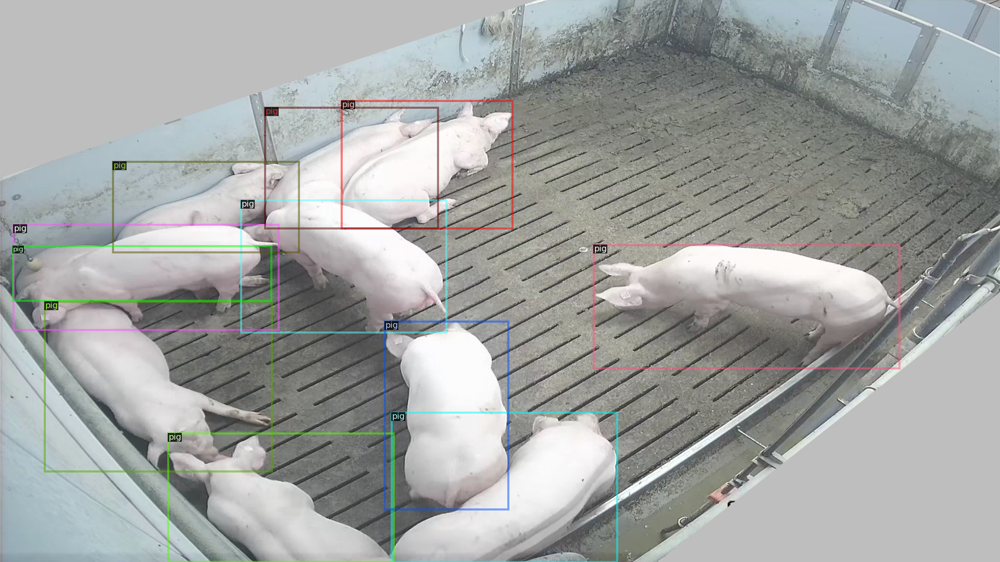

In [ ]:
for d in random.sample(dataset, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=pigs_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer

# Training
cfg = get_cfg()
#cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("pigs",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "/gdrive/MyDrive/pigs/jobr/model_r50fpn3x_final_masked.pth"
#cfg.MODEL.WEIGHTS = "/gdrive/MyDrive/pigs/jobr/model_final_masked.pth"  # Let training initialize from pretrained model (jobr data)
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.000125  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (pig). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[08/01 21:40:22 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/01 21:40:54 d2.utils.events]:  eta: 0:03:00  iter: 19  total_loss: 1.333  loss_cls: 0.3878  loss_box_reg: 0.8268  loss_rpn_cls: 0.03029  loss_rpn_loc: 0.07905  time: 0.6427  data_time: 0.0450  lr: 8.0338e-06  max_mem: 4786M
[08/01 21:41:07 d2.utils.events]:  eta: 0:02:48  iter: 39  total_loss: 1.089  loss_cls: 0.3245  loss_box_reg: 0.6693  loss_rpn_cls: 0.02473  loss_rpn_loc: 0.07727  time: 0.6456  data_time: 0.0187  lr: 1.6359e-05  max_mem: 4786M
[08/01 21:41:20 d2.utils.events]:  eta: 0:02:35  iter: 59  total_loss: 0.8428  loss_cls: 0.2692  loss_box_reg: 0.5029  loss_rpn_cls: 0.01591  loss_rpn_loc: 0.05792  time: 0.6418  data_time: 0.0211  lr: 2.4684e-05  max_mem: 4786M
[08/01 21:41:33 d2.utils.events]:  eta: 0:02:22  iter: 79  total_loss: 0.7528  loss_cls: 0.2298  loss_box_reg: 0.4596  loss_rpn_cls: 0.01235  loss_rpn_loc: 0.04578  time: 0.6430  data_time: 0.0207  lr: 3.3009e-05  max_mem: 4786M
[08/01 21:41:46 d2.utils.events]:  eta: 0:02:09  iter: 99  total_loss: 0.6933  loss_cl

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[08/01 21:44:25 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

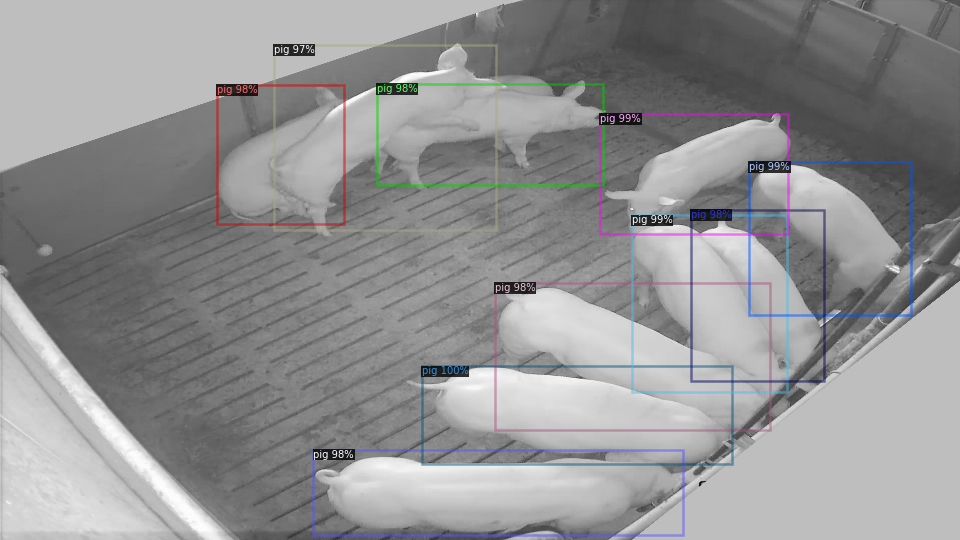

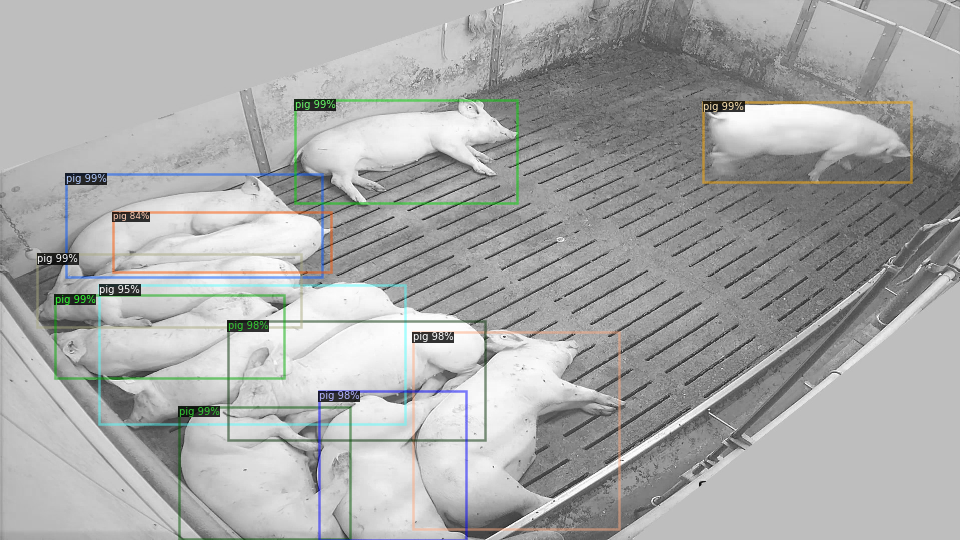

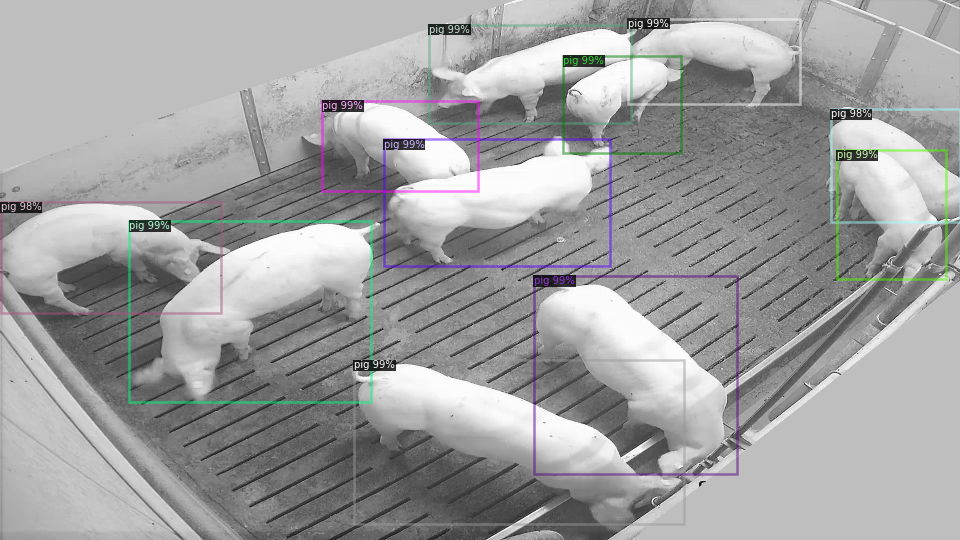

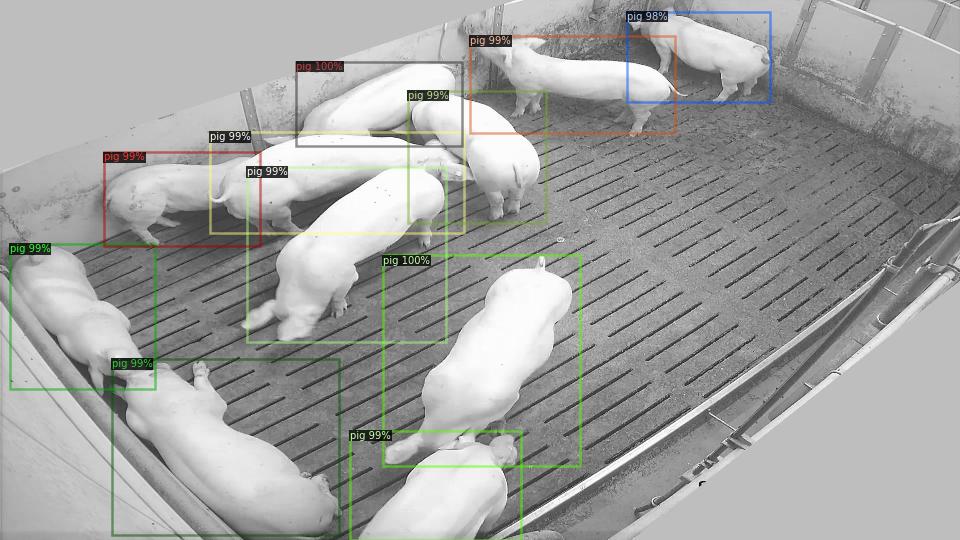

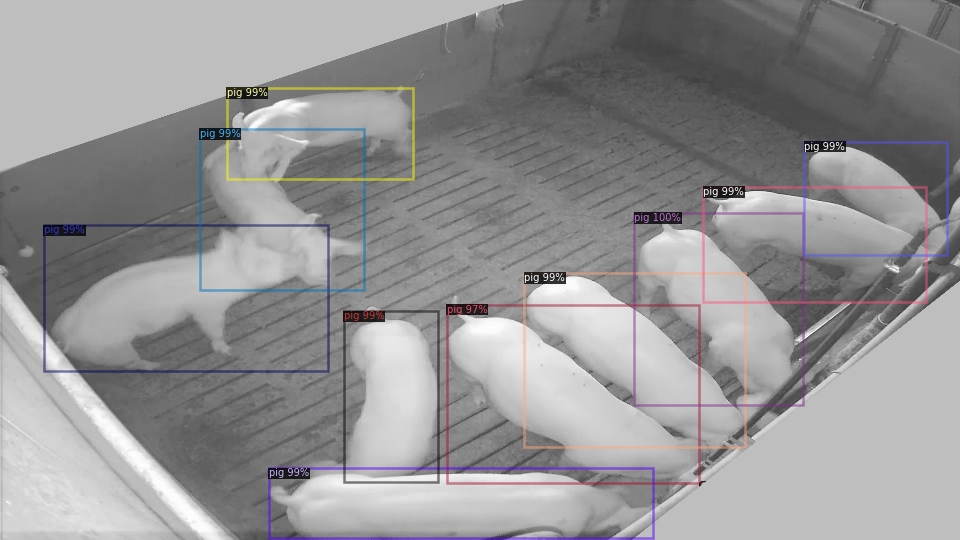

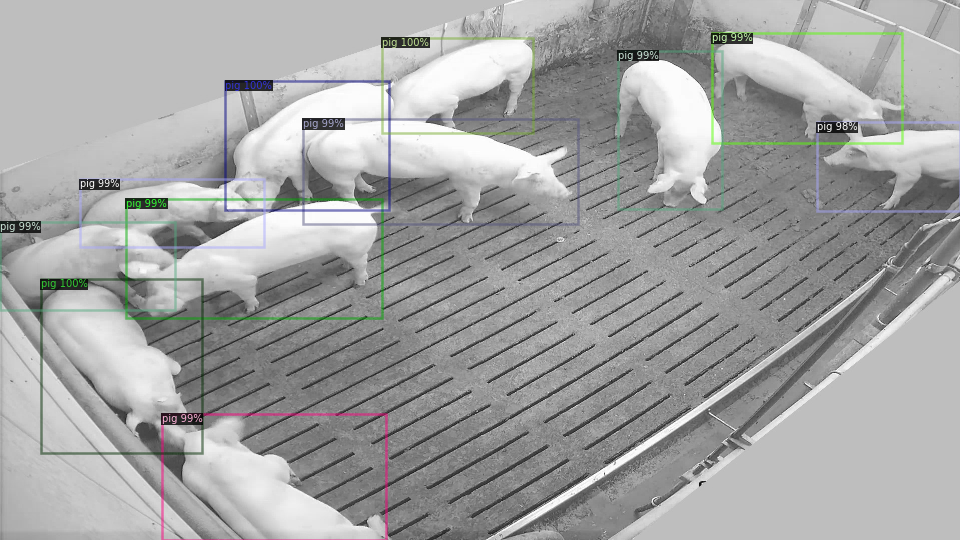

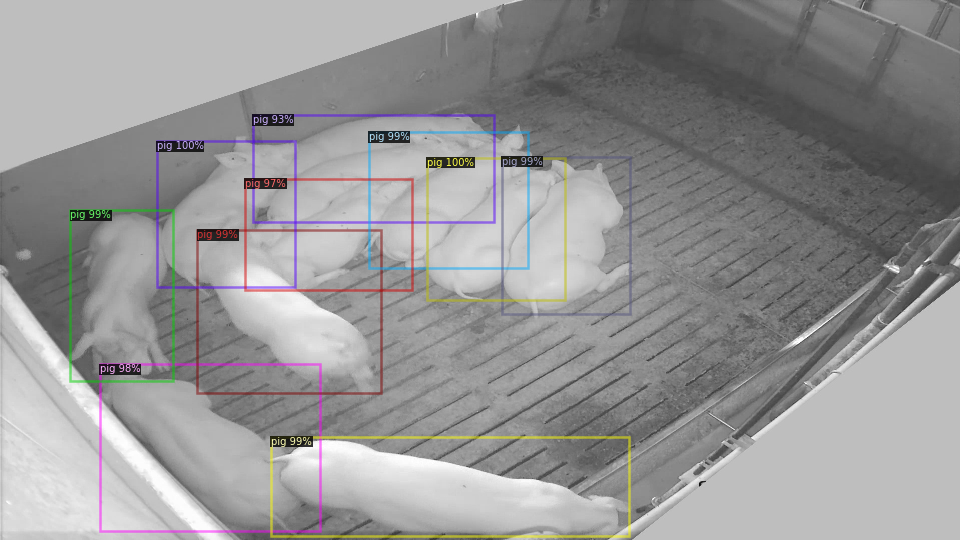

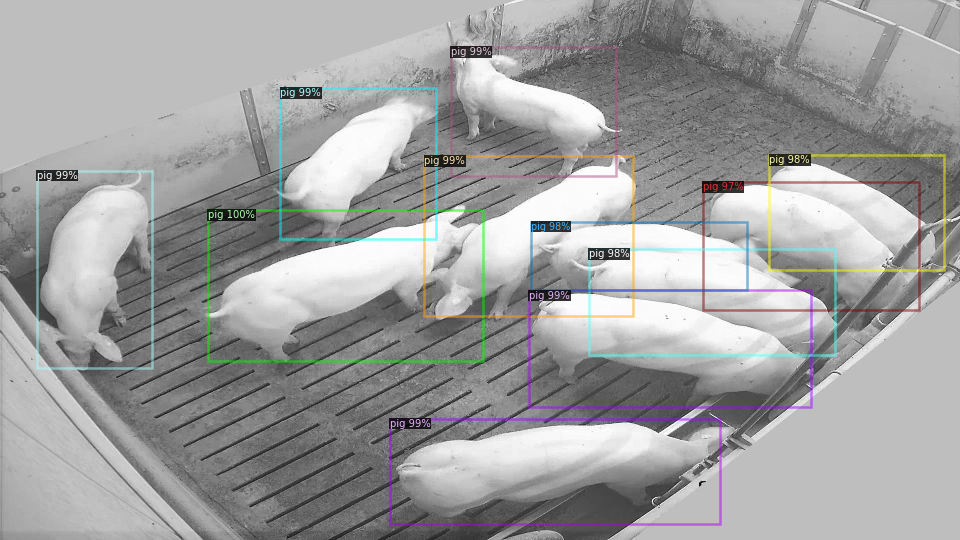

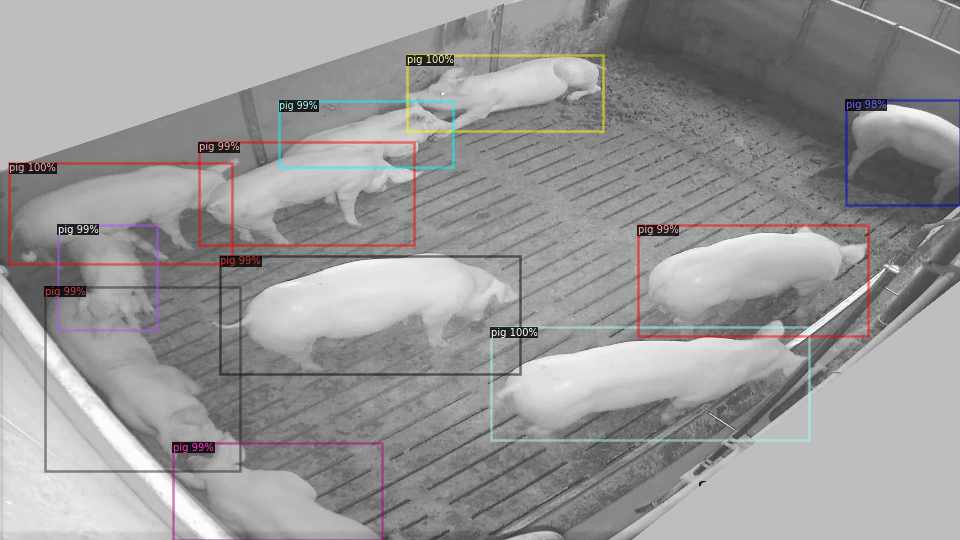

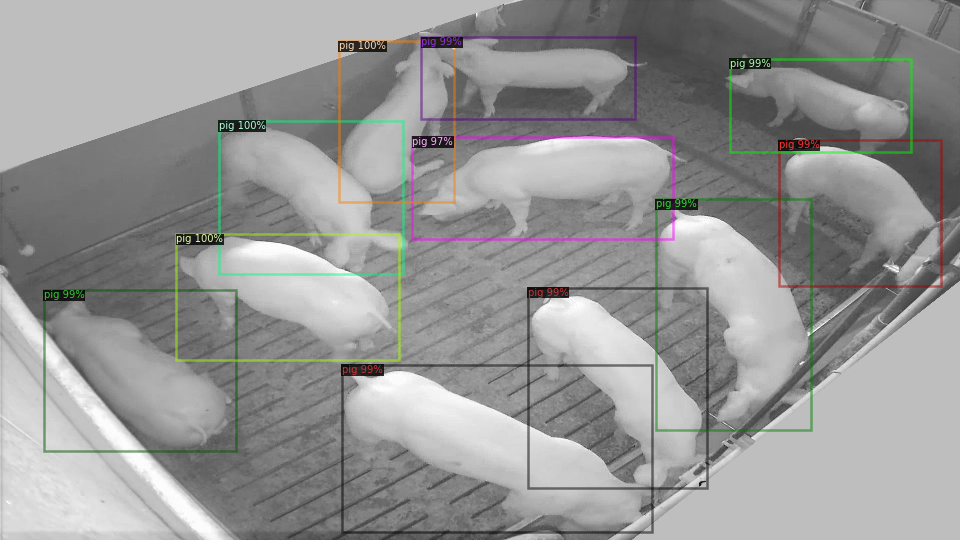

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=pigs_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = "/gdrive/MyDrive/pigs/jobr/model_final_masked.pth"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7


predictor = DefaultPredictor(cfg)

[07/20 13:26:23 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,8,3,3)         |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

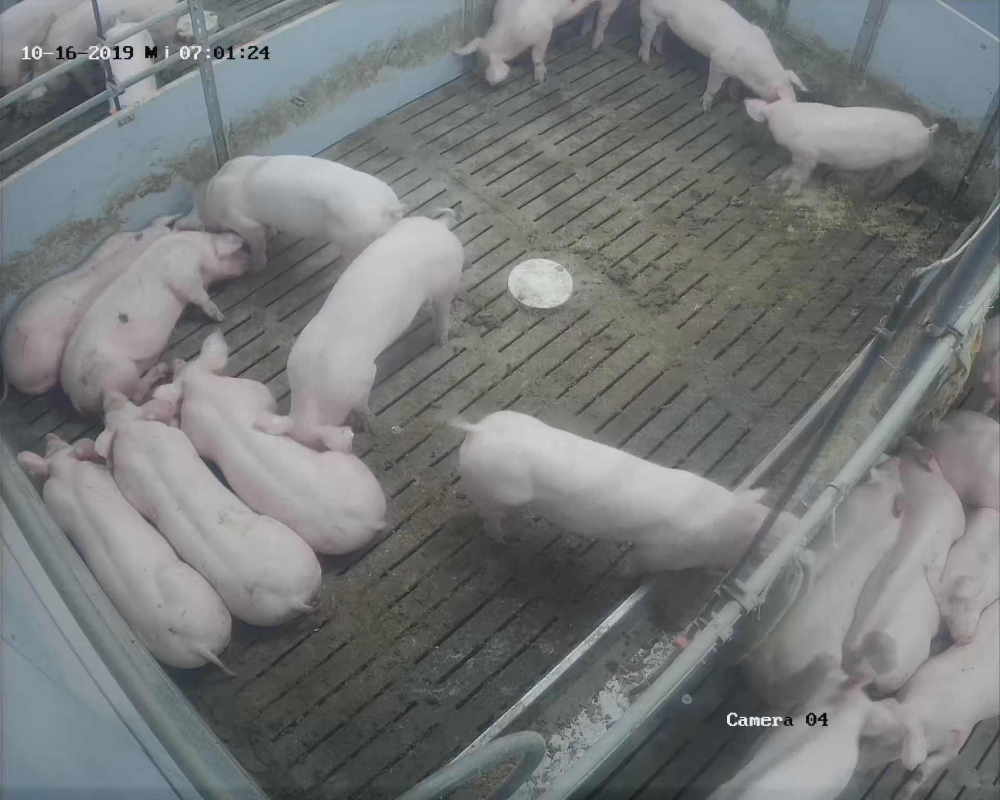

In [ ]:
image = cv2.imread("/gdrive/MyDrive/pigs/Images/2_images_00003.png")
cv2_imshow(image)

In [ ]:
from detectron2.utils.visualizer import ColorMode

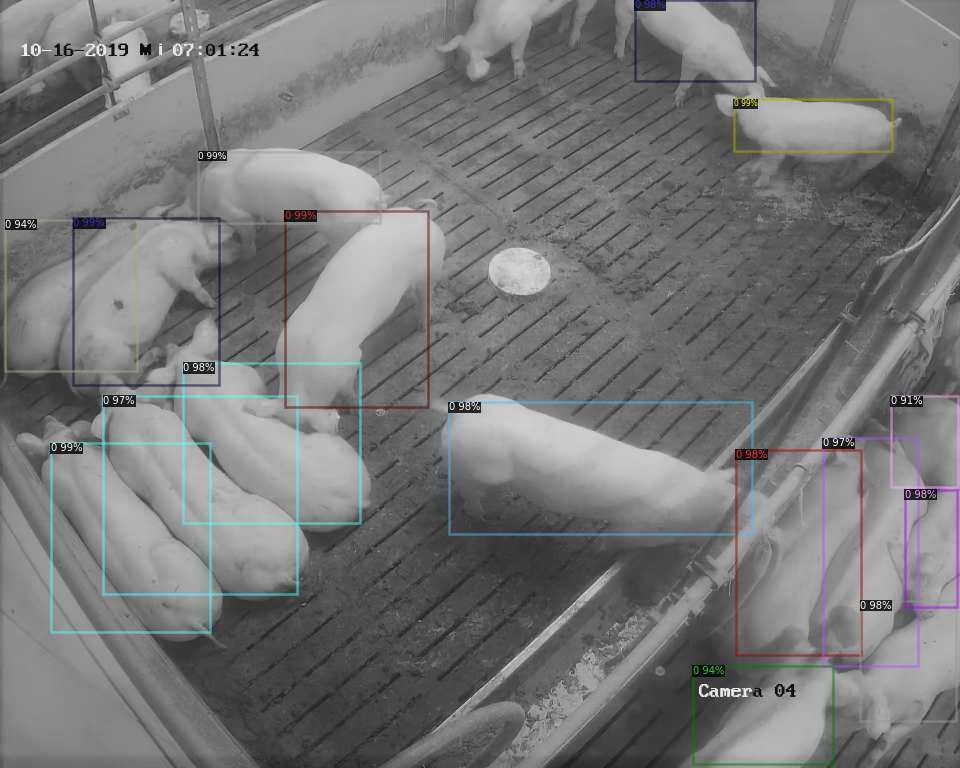

In [ ]:
outputs = predictor(image)
v = Visualizer(image[:, :, ::-1],
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
!cp /content/output/model_final.pth /gdrive/MyDrive/pigs/model_final_r50fpn3x_finetuned.pth

In [ ]:
!git clone https://github.com/facebookresearch/detectron2

%run detectron2/demo/demo.py --config-file detectron2/configs/COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml --video-input /gdrive/MyDrive/pigs/testvideo640.mp4 --confidence-threshold 0.7 --output video-output.mkv \
  --opts MODEL.WEIGHTS /content/output/model_final.pth

Cloning into 'detectron2'...
remote: Enumerating objects: 14465, done.
remote: Counting objects: 100% (40/40), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 14465 (delta 14), reused 31 (delta 12), pack-reused 14425
Receiving objects: 100% (14465/14465), 5.93 MiB | 19.39 MiB/s, done.
Resolving deltas: 100% (10455/10455), done.
[07/20 16:04:52 detectron2]: Arguments: Namespace(confidence_threshold=0.7, config_file='detectron2/configs/COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml', input=None, opts=['MODEL.WEIGHTS', '/content/output/model_final.pth'], output='video-output.mkv', video_input='/gdrive/MyDrive/pigs/testvideo640.mp4', webcam=False)
[07/20 16:04:53 fvcore.common.checkpoint]: [Checkpointer] Loading from /content/output/model_final.pth ...
WARNING [07/20 16:04:54 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.bbox_pred.bias in checkpoint is torch.Size([4]), while shape of roi_heads.box_predictor.bbox_pred.bias in model is torch.Size(

100%|██████████| 165/165 [00:50<00:00,  3.29it/s]
